In [2]:
import pandas as pd
import csv
import numpy as np
import seaborn as sns
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
from tqdm import tqdm as tqdm
import time
import datetime
import os
import glob
from datetime import datetime 

In [3]:
#read through the csvs provided 
files = glob.glob('C:/Users/Miles/Desktop/ICE data/Apps/OBDLink (1)/CsvLogs/With Trip Fuel/*.csv')

full_df = pd.DataFrame()


In [4]:
from datetime import datetime
import time
timestamp = time.time()
date_object = datetime.fromtimestamp(timestamp)
print("Datetime:", date_object)

Datetime: 2024-07-23 17:44:45.910960


In [5]:
#read starting time from csv and convert it to UTC timestamp
import pytz
#timestamp for ac
def calc_starting_timestamp(csv_file):
    path = f"C:/Users/Miles/Desktop/ICE data/Apps/OBDLink (1)/CsvLogs/With Trip Fuel/{csv_file}"


    with open(path, 'r') as file:
        csv_reader = csv.reader(file)
        date = next(csv_reader)[0][14:-3].strip()

    month = int(date[3:4])
    day = int(date[5:7])
    year = int(date[8:12])
    hour = int(date[13:15])
    minute = int(date[16:18])
    second = int(date[19:21])
    
    specific_date = datetime(year, month, day, hour, minute, second)
    local_dt = datetime.fromtimestamp(specific_date.timestamp())

    # Define your local timezone
    local_timezone = pytz.timezone("America/Los_Angeles")  # Replace 'Your_Local_Timezone' with your actual timezone name

    # Convert the local datetime to your local timezone
    local_dt = local_timezone.localize(local_dt)

    # Convert the local datetime to UTC timezone
    utc_dt = local_dt.astimezone(pytz.UTC)
    return datetime.fromtimestamp(utc_dt.timestamp()+43200)



In [6]:
#
date = calc_starting_timestamp('CSVLog_20240618_081410.csv')
date

datetime.datetime(2024, 6, 18, 20, 14, 10)

In [7]:
folder = glob.glob('*.csv')
read_path = "C:/Users/Miles/Desktop/ICE data/Apps/OBDLink (1)/CsvLogs/With Trip Fuel/"
dir_list = os.listdir(read_path)

csv_files = []

for file in dir_list:
    if file.endswith('.csv'):
        csv_files.append(file)


In [8]:
csv_files

['CSVLog_20240618_081410.csv',
 'CSVLog_20240618_111818.csv',
 'CSVLog_20240618_152543.csv',
 'CSVLog_20240621_130920.csv',
 'CSVLog_20240622_072708.csv',
 'CSVLog_20240622_102252.csv',
 'CSVLog_20240622_123857.csv',
 'CSVLog_20240625_082319.csv',
 'CSVLog_20240625_113946.csv',
 'CSVLog_20240627_082138.csv',
 'CSVLog_20240627_161618.csv',
 'CSVLog_20240628_091814.csv',
 'CSVLog_20240701_081750.csv',
 'CSVLog_20240702_171156.csv',
 'CSVLog_20240712_082118.csv']

In [9]:
len(csv_files)

15

In [10]:
import warnings 


for file in csv_files:  
    df_individual = pd.read_csv(read_path+file, comment="#")
    #Add timestamps column that can be used for OpenWeatherMap API
    warnings.filterwarnings("ignore")
    #baseTime = calc_starting_timestamp(file)
    df_individual['Timestamp'] = calc_starting_timestamp(file)
       

In [11]:
df_individual 

,Time (sec),Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),Fuel rate (gal/hr),...,Rotation Rate Z (deg/s),Trip Fuel (gal),Trip Fuel Economy (MPG),Intake air temperature bank 1 sensor 2 (°F),Intake air temperature bank 1 sensor 3 (°F),Intake air temperature bank 2 sensor 1 (°F),Intake air temperature bank 2 sensor 2 (°F),Intake air temperature bank 2 sensor 3 (°F),Vehicle Odometer Reading (miles),Timestamp
0,0.000,34.03307,-118.4652,0.0,0.0,0.0000,0.000000,0.0,0.00000,0.000000,...,-0.529144,0.000000,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
1,2.399,34.03307,-118.4652,0.0,0.0,403.3773,0.151668,0.0,31.02312,0.464387,...,-1.644989,0.000181,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
2,3.392,34.03306,-118.4652,0.0,0.0,403.3797,0.122081,0.0,31.02293,0.373796,...,-0.462265,0.000306,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
3,4.395,34.03305,-118.4652,0.0,0.0,403.3816,0.118347,0.0,31.02279,0.362363,...,-2.328873,0.000402,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
4,5.392,34.03305,-118.4652,0.0,0.0,403.3835,0.118347,0.0,31.02264,0.362363,...,-2.482178,0.000501,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1760,1945.397,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,-77.087950,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18
1761,1946.399,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,-4.109695,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18
1762,1947.404,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,11.736790,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18
1763,1948.411,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,4.536438,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18


In [12]:
def calc_starting_timestamp_no_ac(csv_file):
    path = f"C:/Users/Miles/Desktop/ICE data/Apps/OBDLink (1)/CsvLogs/No AC/{csv_file}"
    

    with open(path, 'r') as file:
        csv_reader = csv.reader(file)
        date = next(csv_reader)[0][14:-3].strip()

    month = int(date[3:4])
    day = int(date[5:7])
    year = int(date[8:12])
    hour = int(date[13:15])
    minute = int(date[16:18])
    second = int(date[19:21])
    
    specific_date = datetime(year, month, day, hour, minute, second)
    local_dt = datetime.fromtimestamp(specific_date.timestamp())

    # Define your local timezone
    local_timezone = pytz.timezone("America/Los_Angeles")  # Replace 'Your_Local_Timezone' with your actual timezone name

    # Convert the local datetime to your local timezone
    local_dt = local_timezone.localize(local_dt)

    # Convert the local datetime to UTC timezone
    utc_dt = local_dt.astimezone(pytz.UTC)
    return datetime.fromtimestamp(utc_dt.timestamp()+43200)

In [13]:
nac_files = glob.glob('C:/Users/Miles/Desktop/ICE data/Apps/OBDLink (1)/CsvLogs/No AC/*.csv')

nac_read_path = "C:/Users/Miles/Desktop/ICE data/Apps/OBDLink (1)/CsvLogs/No AC/"
nac_dir_list = os.listdir(nac_read_path)

no_ac_csv_files = []

for nac_files in nac_dir_list:
    if nac_files.endswith('.csv'):
        no_ac_csv_files.append(nac_files)

In [14]:
no_ac_csv_files

['CSVLog_20240620_081027_without_ac_on.csv',
 'CSVLog_20240621_081136_no_ac_day2.csv',
 'CSVLog_20240625_113946_noAC.csv',
 'CSVLog_20240704_103822.csv',
 'CSVLog_20240705_080909.csv',
 'CSVLog_20240710_094029.csv',
 'CSVLog_20240717_092013.csv']

In [15]:
len(no_ac_csv_files)

7

In [16]:
for nac_files in no_ac_csv_files:  
    no_acdf = pd.read_csv(nac_read_path+nac_files, comment="#")
    #Add timestamps column that can be used for OpenWeatherMap API
    warnings.filterwarnings("ignore")
    #baseTime = calc_starting_timestamp_no_ac(nac_files)
    no_acdf['Timestamp'] = calc_starting_timestamp_no_ac(nac_files)
       

In [17]:
no_acdf

,Time (sec),Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),Fuel rate (gal/hr),...,Rotation Rate Z (deg/s),Trip Fuel (gal),Trip Fuel Economy (MPG),Intake air temperature bank 1 sensor 2 (°F),Intake air temperature bank 1 sensor 3 (°F),Intake air temperature bank 2 sensor 1 (°F),Intake air temperature bank 2 sensor 2 (°F),Intake air temperature bank 2 sensor 3 (°F),Vehicle Odometer Reading (miles),Timestamp
0,0.000,34.03345,-118.4489,0.0,0.0,0.0000,0.000000,0.0,0.00000,0.000000,...,0.000000,0.000000,0.00000,0,0,0,0,0,0,2024-07-17 21:20:13
1,0.876,34.03345,-118.4489,0.0,0.0,0.0000,0.000000,0.0,30.87776,0.000000,...,-0.294937,0.000000,0.00000,0,0,0,0,0,0,2024-07-17 21:20:13
2,1.870,34.03347,-118.4489,0.0,0.0,417.8370,0.093356,0.0,30.87764,0.285844,...,0.082184,0.000082,0.00000,0,0,0,0,0,0,2024-07-17 21:20:13
3,2.871,34.03347,-118.4489,0.0,0.0,417.8388,0.090483,0.0,30.87750,0.277049,...,-0.102524,0.000175,0.00000,0,0,0,0,0,0,2024-07-17 21:20:13
4,3.882,34.03347,-118.4489,0.0,0.0,417.8402,0.093643,0.0,30.87740,0.286724,...,-0.678421,0.000245,0.00000,0,0,0,0,0,0,2024-07-17 21:20:13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678,1790.879,34.24307,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,0.028464,...,26.430270,0.706940,27.71188,0,0,0,0,0,0,2024-07-17 21:20:13
1679,1791.882,34.24306,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,0.028464,...,12.285000,0.706940,27.71188,0,0,0,0,0,0,2024-07-17 21:20:13
1680,1792.879,34.24305,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,0.028464,...,22.322040,0.706940,27.71188,0,0,0,0,0,0,2024-07-17 21:20:13
1681,1793.872,34.24303,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,0.028464,...,9.690566,0.706940,27.71188,0,0,0,0,0,0,2024-07-17 21:20:13


In [18]:
#combine dataframes after reading through ac and non-ac data

In [19]:
df_individual .dropna(axis=1, how='all')

,Time (sec),Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),Fuel rate (gal/hr),...,Rotation Rate Z (deg/s),Trip Fuel (gal),Trip Fuel Economy (MPG),Intake air temperature bank 1 sensor 2 (°F),Intake air temperature bank 1 sensor 3 (°F),Intake air temperature bank 2 sensor 1 (°F),Intake air temperature bank 2 sensor 2 (°F),Intake air temperature bank 2 sensor 3 (°F),Vehicle Odometer Reading (miles),Timestamp
0,0.000,34.03307,-118.4652,0.0,0.0,0.0000,0.000000,0.0,0.00000,0.000000,...,-0.529144,0.000000,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
1,2.399,34.03307,-118.4652,0.0,0.0,403.3773,0.151668,0.0,31.02312,0.464387,...,-1.644989,0.000181,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
2,3.392,34.03306,-118.4652,0.0,0.0,403.3797,0.122081,0.0,31.02293,0.373796,...,-0.462265,0.000306,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
3,4.395,34.03305,-118.4652,0.0,0.0,403.3816,0.118347,0.0,31.02279,0.362363,...,-2.328873,0.000402,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
4,5.392,34.03305,-118.4652,0.0,0.0,403.3835,0.118347,0.0,31.02264,0.362363,...,-2.482178,0.000501,0.00000,0,0,0,0,0,0,2024-07-12 20:21:18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1760,1945.397,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,-77.087950,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18
1761,1946.399,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,-4.109695,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18
1762,1947.404,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,11.736790,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18
1763,1948.411,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,0.028464,...,4.536438,0.738124,26.81557,0,0,0,0,0,0,2024-07-12 20:21:18


In [20]:
df_individual.keys()

Index(['Time (sec)', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)',
       ' Fuel system 1 status', ' Calculated load value (%)',
       ' Engine coolant temperature (°F)', ' Fuel rail pressure (gauge) (psi)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor voltage wide range (Bank 2  Sensor 4) (V)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Fuel type', ' Alcohol fuel percentage (%)',
       ' Evap system vapor pressure (inH2O)', ' Engine oil temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',
       ' Commanded intake air flow A control (%)',
       ' Relative intake air flow A position (%)

In [21]:
features_to_select = [ 'Time (sec)','Timestamp', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)', ' Calculated load value (%)',
       ' Engine coolant temperature (°F)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)', ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',' Engine Fuel Rate (lb/min)',
       ' Vehicle Fuel Rate (lb/min)', ' Engine Exhaust Flow Rate (lb/min)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual',
       ' Trip Distance (miles)', ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 Rate (lb/mile)', ' Total Trip CO2 (lbs)',
       ' Accel X (ft/s²)', ' Accel Y (ft/s²)', ' Accel Z (ft/s²)', ' Trip Fuel (gal)', ' Trip Fuel Economy (MPG)']

full_df  = df_individual[features_to_select]

In [22]:
full_df.keys()

Index(['Time (sec)', 'Timestamp', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)',
       ' Calculated load value (%)', ' Engine coolant temperature (°F)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',
       ' Engine Fuel Rate (lb/min)', ' Vehicle Fuel Rate (lb/min)',
       ' Engine Exhaust Flow Rate (lb/min)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual', ' Trip Distance (miles)',
       ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 

In [23]:
full_df

,Time (sec),Timestamp,Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),...,Trip Distance (miles),Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG)
0,0.000,2024-07-12 20:21:18,34.03307,-118.4652,0.0,0.0,0.0000,0.000000,0.0,0.00000,...,0.00000,0.000000,0.00000,0.000000,0.000000,-6.347265,10.080920,-18.084070,0.000000,0.00000
1,2.399,2024-07-12 20:21:18,34.03307,-118.4652,0.0,0.0,403.3773,0.151668,0.0,31.02312,...,0.00000,0.034234,0.00000,0.000000,0.003549,0.801627,-0.206871,-0.298559,0.000181,0.00000
2,3.392,2024-07-12 20:21:18,34.03306,-118.4652,0.0,0.0,403.3797,0.122081,0.0,31.02293,...,0.00000,0.051419,0.00000,0.000000,0.005990,0.238660,-0.176041,-3.889984,0.000306,0.00000
3,4.395,2024-07-12 20:21:18,34.03305,-118.4652,0.0,0.0,403.3816,0.118347,0.0,31.02279,...,0.00000,0.068604,0.00000,0.000000,0.007872,1.230891,-0.479812,1.762333,0.000402,0.00000
4,5.392,2024-07-12 20:21:18,34.03305,-118.4652,0.0,0.0,403.3835,0.118347,0.0,31.02264,...,0.00000,0.085737,0.00000,0.000000,0.009824,1.734274,-0.879573,2.986771,0.000501,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1760,1945.397,2024-07-12 20:21:18,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,...,19.79321,31.883420,96.31254,0.730763,14.461660,-20.890300,22.757530,20.607710,0.738124,26.81557
1761,1946.399,2024-07-12 20:21:18,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,...,19.79321,31.883420,96.31254,0.730763,14.461660,4.825788,25.322620,7.322868,0.738124,26.81557
1762,1947.404,2024-07-12 20:21:18,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,...,19.79321,31.883420,96.31254,0.730763,14.461660,-1.290766,12.238080,2.462255,0.738124,26.81557
1763,1948.411,2024-07-12 20:21:18,34.24296,-118.5322,0.0,0.0,417.8354,0.009296,0.0,30.87776,...,19.79321,31.883420,96.31254,0.730763,14.461660,-2.609597,9.848006,0.653723,0.738124,26.81557


In [24]:
no_acdf.keys()

Index(['Time (sec)', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)',
       ' Fuel system 1 status', ' Calculated load value (%)',
       ' Engine coolant temperature (°F)', ' Fuel rail pressure (gauge) (psi)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor voltage wide range (Bank 2  Sensor 4) (V)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Fuel type', ' Alcohol fuel percentage (%)',
       ' Evap system vapor pressure (inH2O)', ' Engine oil temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',
       ' Commanded intake air flow A control (%)',
       ' Relative intake air flow A position (%)

In [22]:
for csv_file in next_files:#merge data into one csv
    no_AC_df.to_csv('merged_vehicle_data_no_ac.csv', index=False)
    df = pd.read_csv(csv_file, skiprows=[0, 1])
    no_AC_df = pd.concat([no_AC_df, df])

NameError: name 'next_files' is not defined

In [25]:
no_AC_df = no_acdf[features_to_select]
no_AC_df

,Time (sec),Timestamp,Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),...,Trip Distance (miles),Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG)
0,0.000,2024-07-17 21:20:13,34.03345,-118.4489,0.0,0.0,0.0000,0.000000,0.0,0.00000,...,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
1,0.876,2024-07-17 21:20:13,34.03345,-118.4489,0.0,0.0,0.0000,0.000000,0.0,30.87776,...,0.00000,0.000000,0.00000,0.000000,0.000000,1.573695,12.039260,5.694087,0.000000,0.00000
2,1.870,2024-07-17 21:20:13,34.03347,-118.4489,0.0,0.0,417.8370,0.093356,0.0,30.87764,...,0.00000,0.027168,0.00000,0.000000,0.001597,0.271709,4.812025,0.246296,0.000082,0.00000
3,2.871,2024-07-17 21:20:13,34.03347,-118.4489,0.0,0.0,417.8388,0.090483,0.0,30.87750,...,0.00000,0.047180,0.00000,0.000000,0.003430,-0.060623,1.494337,-0.738523,0.000175,0.00000
4,3.882,2024-07-17 21:20:13,34.03347,-118.4489,0.0,0.0,417.8402,0.093643,0.0,30.87740,...,0.00000,0.061546,0.00000,0.000000,0.004806,0.619907,0.759902,-0.507991,0.000245,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678,1790.879,2024-07-17 21:20:13,34.24307,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,19.59063,29.323010,88.85608,0.707128,13.850690,-2.164789,18.052800,-3.061960,0.706940,27.71188
1679,1791.882,2024-07-17 21:20:13,34.24306,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,19.59063,29.323010,88.85608,0.707128,13.850690,-3.472208,20.497950,0.866240,0.706940,27.71188
1680,1792.879,2024-07-17 21:20:13,34.24305,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,19.59063,29.323010,88.85608,0.707128,13.850690,-4.860671,22.315400,5.276106,0.706940,27.71188
1681,1793.872,2024-07-17 21:20:13,34.24303,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,19.59063,29.323010,88.85608,0.707128,13.850690,6.851851,-0.027845,-1.587939,0.706940,27.71188


In [26]:
no_AC_df.keys()

Index(['Time (sec)', 'Timestamp', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)',
       ' Calculated load value (%)', ' Engine coolant temperature (°F)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',
       ' Engine Fuel Rate (lb/min)', ' Vehicle Fuel Rate (lb/min)',
       ' Engine Exhaust Flow Rate (lb/min)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual', ' Trip Distance (miles)',
       ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 

In [ ]:
"""
Something to consider with the No-AC data is if we can't collect more, 
supplemental it by doing data upsampling techniques from scikit-learn

I'll put the code in here if it's needed later:

from sklearn.utils import resample



#upsample/downsample accordingly so that data is balanced
training_no_ac_upsample = resample(no_AC_df, replace=True, n_samples=20000, random_state=123)

no_ac_resample = resample(no_AC_df, replace=True, n_samples=10000, random_state=123)
ac_resample = resample(full_df, replace=True, n_samples=10000, random_state=123)

#and then combine: (this part is optional as well, the way its combined below should still work)

all_df = pd.concat([no_ac_resample, ac_resample], axis=0).sample(frac=1.0, random_state=1).reset_index(drop=True)
all_df


"""

In [27]:
"""
Create classifier using ac vs non-ac data so that the model can determine which one has the ac running
and make determinations from there


Test with DecisionTreeClassifier, binary classification


"""

#create on/off feature

full_df['On or Off'] = 'On'
no_AC_df['On or Off'] = 'Off'

#combine data
all_df = pd.concat([full_df, no_AC_df], axis=0)
all_df



,Time (sec),Timestamp,Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),...,Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG),On or Off
0,0.000,2024-07-12 20:21:18,34.03307,-118.4652,0.0,0.0,0.0000,0.000000,0.0,0.00000,...,0.000000,0.00000,0.000000,0.000000,-6.347265,10.080920,-18.084070,0.000000,0.00000,On
1,2.399,2024-07-12 20:21:18,34.03307,-118.4652,0.0,0.0,403.3773,0.151668,0.0,31.02312,...,0.034234,0.00000,0.000000,0.003549,0.801627,-0.206871,-0.298559,0.000181,0.00000,On
2,3.392,2024-07-12 20:21:18,34.03306,-118.4652,0.0,0.0,403.3797,0.122081,0.0,31.02293,...,0.051419,0.00000,0.000000,0.005990,0.238660,-0.176041,-3.889984,0.000306,0.00000,On
3,4.395,2024-07-12 20:21:18,34.03305,-118.4652,0.0,0.0,403.3816,0.118347,0.0,31.02279,...,0.068604,0.00000,0.000000,0.007872,1.230891,-0.479812,1.762333,0.000402,0.00000,On
4,5.392,2024-07-12 20:21:18,34.03305,-118.4652,0.0,0.0,403.3835,0.118347,0.0,31.02264,...,0.085737,0.00000,0.000000,0.009824,1.734274,-0.879573,2.986771,0.000501,0.00000,On
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678,1790.879,2024-07-17 21:20:13,34.24307,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,29.323010,88.85608,0.707128,13.850690,-2.164789,18.052800,-3.061960,0.706940,27.71188,Off
1679,1791.882,2024-07-17 21:20:13,34.24306,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,29.323010,88.85608,0.707128,13.850690,-3.472208,20.497950,0.866240,0.706940,27.71188,Off
1680,1792.879,2024-07-17 21:20:13,34.24305,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,29.323010,88.85608,0.707128,13.850690,-4.860671,22.315400,5.276106,0.706940,27.71188,Off
1681,1793.872,2024-07-17 21:20:13,34.24303,-118.5322,0.0,0.0,431.6861,0.009296,0.0,30.77618,...,29.323010,88.85608,0.707128,13.850690,6.851851,-0.027845,-1.587939,0.706940,27.71188,Off


In [28]:
full_df['On or Off']

0       On
1       On
2       On
3       On
4       On
        ..
1760    On
1761    On
1762    On
1763    On
1764    On
Name: On or Off, Length: 1765, dtype: object

In [29]:
no_AC_df['On or Off']

0       Off
1       Off
2       Off
3       Off
4       Off
       ... 
1678    Off
1679    Off
1680    Off
1681    Off
1682    Off
Name: On or Off, Length: 1683, dtype: object

In [30]:
#make sure no nans, sometimes this glitches on notebooks, so always double check before running everything else
all_df.isna().sum()

Time (sec)                                                          0
Timestamp                                                           0
 Latitude (deg)                                                     0
 Longitude (deg)                                                    0
 Vehicle speed (MPH)                                                0
 Instant CO2 rate (lb/mile)                                         0
 Total CO2 (lbs)                                                    0
 CO2 flow (lb/min)                                                  0
 Instant fuel economy (MPG)                                         0
 Total fuel economy (MPG)                                           0
 Fuel rate (gal/hr)                                                 0
 Calculated load value (%)                                          0
 Engine coolant temperature (°F)                                    0
 Engine RPM (RPM)                                                   0
 Intake air temperat

In [31]:
all_df.dtypes

Time (sec)                                                                 float64
Timestamp                                                           datetime64[us]
 Latitude (deg)                                                            float64
 Longitude (deg)                                                           float64
 Vehicle speed (MPH)                                                       float64
 Instant CO2 rate (lb/mile)                                                float64
 Total CO2 (lbs)                                                           float64
 CO2 flow (lb/min)                                                         float64
 Instant fuel economy (MPG)                                                float64
 Total fuel economy (MPG)                                                  float64
 Fuel rate (gal/hr)                                                        float64
 Calculated load value (%)                                                 float64
 Eng

In [32]:
all_df.keys()

Index(['Time (sec)', 'Timestamp', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)',
       ' Calculated load value (%)', ' Engine coolant temperature (°F)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',
       ' Engine Fuel Rate (lb/min)', ' Vehicle Fuel Rate (lb/min)',
       ' Engine Exhaust Flow Rate (lb/min)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual', ' Trip Distance (miles)',
       ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 

In [33]:
#shuffle data

all_df = all_df.sample(frac = 1)

all_df

,Time (sec),Timestamp,Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),...,Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG),On or Off
1622,1734.879,2024-07-17 21:20:13,34.24307,-118.5322,10.56331,0.368739,431.6631,0.064918,53.14290,30.77697,...,28.897900,88.85608,0.706631,13.827720,-1.928364,0.712207,-4.073052,0.705768,27.73134,Off
1519,1675.401,2024-07-12 20:21:18,34.23585,-118.5227,0.00000,0.000000,416.7563,0.063036,0.00000,30.90719,...,27.919520,96.31254,0.715056,13.382530,0.269107,0.254353,0.642516,0.683045,27.40463,On
837,949.396,2024-07-12 20:21:18,34.13934,-118.4711,87.61333,0.491987,411.2078,0.718410,39.82999,30.85809,...,15.822630,87.61333,0.876902,7.834100,4.090528,-5.119399,0.160882,0.399853,22.34666,On
757,869.396,2024-07-12 20:21:18,34.11784,-118.4815,73.32180,0.117059,410.2280,0.143050,167.40080,30.85359,...,14.482970,85.12785,0.939353,6.854290,-2.265807,1.373954,-12.264840,0.349843,20.86100,On
909,940.871,2024-07-17 21:20:13,34.20426,-118.4733,79.53551,0.649218,427.5183,0.860599,30.18373,30.79287,...,15.678900,88.85608,0.722297,9.682980,-0.107670,0.301884,8.157375,0.494220,27.12988,Off
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1348,1441.877,2024-07-17 21:20:13,34.23589,-118.5113,15.53428,2.678282,430.4190,0.693420,7.31657,30.78777,...,24.023070,88.85608,0.704894,12.583630,2.696739,1.072016,-0.094043,0.642269,27.79968,Off
1015,1127.398,2024-07-12 20:21:18,34.19416,-118.4742,75.18591,0.646432,413.1357,0.810043,30.31385,30.90191,...,18.782510,96.31254,0.757122,9.761996,-5.472942,9.420733,-31.563730,0.498253,25.88202,On
473,585.404,2024-07-12 20:21:18,34.04935,-118.4482,19.26251,1.891482,405.7023,0.607245,10.36004,30.94188,...,9.753856,42.87461,1.164929,2.328547,-0.792657,-0.065328,-6.794096,0.118849,16.82149,On
725,756.884,2024-07-17 21:20:13,34.14989,-118.4686,81.39963,0.140645,425.3848,0.190808,139.32810,30.76678,...,12.605010,88.85608,0.795784,7.549415,-0.357789,-2.228157,3.209837,0.385323,24.62457,Off


In [34]:
all_df.drop(columns=['Timestamp'])

,Time (sec),Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),Fuel rate (gal/hr),...,Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG),On or Off
1622,1734.879,34.24307,-118.5322,10.56331,0.368739,431.6631,0.064918,53.14290,30.77697,0.198772,...,28.897900,88.85608,0.706631,13.827720,-1.928364,0.712207,-4.073052,0.705768,27.73134,Off
1519,1675.401,34.23585,-118.5227,0.00000,0.000000,416.7563,0.063036,0.00000,30.90719,0.193009,...,27.919520,96.31254,0.715056,13.382530,0.269107,0.254353,0.642516,0.683045,27.40463,On
837,949.396,34.13934,-118.4711,87.61333,0.491987,411.2078,0.718410,39.82999,30.85809,2.199683,...,15.822630,87.61333,0.876902,7.834100,4.090528,-5.119399,0.160882,0.399853,22.34666,On
757,869.396,34.11784,-118.4815,73.32180,0.117059,410.2280,0.143050,167.40080,30.85359,0.438002,...,14.482970,85.12785,0.939353,6.854290,-2.265807,1.373954,-12.264840,0.349843,20.86100,On
909,940.871,34.20426,-118.4733,79.53551,0.649218,427.5183,0.860599,30.18373,30.79287,2.635046,...,15.678900,88.85608,0.722297,9.682980,-0.107670,0.301884,8.157375,0.494220,27.12988,Off
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1348,1441.877,34.23589,-118.5113,15.53428,2.678282,430.4190,0.693420,7.31657,30.78777,2.123164,...,24.023070,88.85608,0.704894,12.583630,2.696739,1.072016,-0.094043,0.642269,27.79968,Off
1015,1127.398,34.19416,-118.4742,75.18591,0.646432,413.1357,0.810043,30.31385,30.90191,2.480250,...,18.782510,96.31254,0.757122,9.761996,-5.472942,9.420733,-31.563730,0.498253,25.88202,On
473,585.404,34.04935,-118.4482,19.26251,1.891482,405.7023,0.607245,10.36004,30.94188,1.859308,...,9.753856,42.87461,1.164929,2.328547,-0.792657,-0.065328,-6.794096,0.118849,16.82149,On
725,756.884,34.14989,-118.4686,81.39963,0.140645,425.3848,0.190808,139.32810,30.76678,0.584230,...,12.605010,88.85608,0.795784,7.549415,-0.357789,-2.228157,3.209837,0.385323,24.62457,Off


In [35]:
all_df = all_df.drop(columns=['Timestamp'])
all_df.keys()

Index(['Time (sec)', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)',
       ' Calculated load value (%)', ' Engine coolant temperature (°F)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',
       ' Engine Fuel Rate (lb/min)', ' Vehicle Fuel Rate (lb/min)',
       ' Engine Exhaust Flow Rate (lb/min)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual', ' Trip Distance (miles)',
       ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 Rate (lb/mile

In [36]:
from sklearn.model_selection import train_test_split 
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score


param_grid = {'max_depth': [4, 8], 
             'min_samples_leaf': [25, 50]}
y_class = all_df['On or Off']
x_class = all_df.loc[:, all_df.columns != ('On or Off')]

print(x_class.shape)
print(y_class.shape)

X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(x_class, y_class, test_size=0.30, random_state=100)

print(X_train_class.shape)
print(X_test_class.shape)


(3448, 37)
(3448,)
(2413, 37)
(1035, 37)


In [37]:
#try ensemble
from sklearn.ensemble import RandomForestClassifier


rf_class = RandomForestClassifier(max_depth=100, n_estimators = 36, min_samples_leaf = 1, max_features= None)
rf_class.fit(X_train_class, y_train_class)

y_class_pred = rf_class.predict(X_test_class)
class_acc_score = accuracy_score(y_test_class, y_class_pred)
class_acc_score

0.9980676328502416

In [38]:
#better. make it better again

param_grid = {'max_depth': [10,20], 
             'min_samples_leaf': [5,15],
             'n_estimators': [20,50]}

rf_grid = GridSearchCV(rf_class, param_grid, cv=3, scoring='accuracy')
rf_grid_search = rf_grid.fit(X_train_class, y_train_class)

best_params = rf_grid_search.best_params_
best_model = rf_grid_search.best_estimator_

rf_y_pred = best_model.predict(X_test_class)
rf_acc = accuracy_score(y_test_class, rf_y_pred)

print("Accuracy:", rf_acc)


Accuracy: 0.9980676328502416


In [ ]:
#rf classifier for on/off works well, 90+ accuracy isn't too bad

#double check with xgb classifier

In [39]:
#one-hot enc for next models and regression

#encode on or off for regression modeling
to_encode = list(all_df.select_dtypes(include=['object']).columns)
print(to_encode)


['On or Off']


In [40]:
two_options = list(all_df['On or Off'].value_counts().head(2).index)
two_options

['On', 'Off']

In [41]:
for value in two_options:
    all_df['On/Off'] = np.where(all_df['On or Off']==value,1,0)

In [42]:
all_df.drop(columns = 'On or Off', inplace=True)
to_encode.remove('On or Off')

In [43]:
all_df.head()

,Time (sec),Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),Fuel rate (gal/hr),...,Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG),On/Off
1622,1734.879,34.24307,-118.5322,10.56331,0.368739,431.6631,0.064918,53.14290,30.77697,0.198772,...,28.89790,88.85608,0.706631,13.82772,-1.928364,0.712207,-4.073052,0.705768,27.73134,1
1519,1675.401,34.23585,-118.5227,0.00000,0.000000,416.7563,0.063036,0.00000,30.90719,0.193009,...,27.91952,96.31254,0.715056,13.38253,0.269107,0.254353,0.642516,0.683045,27.40463,0
837,949.396,34.13934,-118.4711,87.61333,0.491987,411.2078,0.718410,39.82999,30.85809,2.199683,...,15.82263,87.61333,0.876902,7.83410,4.090528,-5.119399,0.160882,0.399853,22.34666,0
757,869.396,34.11784,-118.4815,73.32180,0.117059,410.2280,0.143050,167.40080,30.85359,0.438002,...,14.48297,85.12785,0.939353,6.85429,-2.265807,1.373954,-12.264840,0.349843,20.86100,0
909,940.871,34.20426,-118.4733,79.53551,0.649218,427.5183,0.860599,30.18373,30.79287,2.635046,...,15.67890,88.85608,0.722297,9.68298,-0.107670,0.301884,8.157375,0.494220,27.12988,1


In [44]:
all_df['On/Off']

1622    1
1519    0
837     0
757     0
909     1
       ..
1348    1
1015    0
473     0
725     1
516     1
Name: On/Off, Length: 3448, dtype: int32

In [45]:
params = {
    'objective': 'reg:squarederror',  # Use 'reg:squarederror' for regression tasks
    'max_depth': 7,                   # Maximum depth of a tree
    'learning_rate': 0.1,             # Learning rate
    'subsample': 0.8,                 # Subsample ratio of the training instances
    'colsample_bytree': 0.8,          # Subsample ratio of columns when constructing each tree
    'eval_metric': 'rmse'             # Evaluation metric (root mean squared error)
}
param_grid = {
    'max_depth': [3, 5, 7, 11],
    'learning_rate': [0.1, 0.01, 0.001],
    'subsample': [0.4, 0.8, 1.0],
    'colsample_bytree': [0.4, 0.8, 1.0]
}

y_class = all_df['On/Off']
x_class = all_df.loc[:, all_df.columns != 'On/Off']

print(x_class.shape)
print(y_class.shape)

X_train, X_test, y_train, y_test = train_test_split(x_class, y_class, test_size=0.30, random_state=100)


print(X_train.shape)
print(X_test.shape)



(3448, 37)
(3448,)
(2413, 37)
(1035, 37)


In [46]:
#xgboost
from sklearn.metrics import accuracy_score, confusion_matrix
import xgboost as xgb
from xgboost import plot_importance

#data for xgb
class_model = xgb.XGBClassifier(**params)


In [47]:
class_model.fit(X_train, y_train)

dtrain = xgb.DMatrix(X_train, label=y_train)

dtest = xgb.DMatrix(X_test, label=y_test)


In [48]:
predicted_labels = class_model.predict(X_test)

In [49]:
class_xb_y_pred = class_model.predict(X_test)

# Calculate R2 score
class_xb_r2 = r2_score(y_test, class_xb_y_pred)
# Calculate RMSE
class_xb_rmse = mean_squared_error(y_test, class_xb_y_pred, squared=False)

print("RMSE:", class_xb_rmse)
print("R2 score:", class_xb_r2)


RMSE: 0.043958698226385796
R2 score: 0.9922701778232522


In [50]:
#search for the right params



grid_search = GridSearchCV(estimator=class_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

print('Done')


Done


In [51]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

class_xb_y_pred = best_model.predict(X_test)

# Calculate R2 score
class_xb_r2 = r2_score(y_test, class_xb_y_pred)
# Calculate RMSE
class_xb_rmse = mean_squared_error(y_test, class_xb_y_pred, squared=False)

print("RMSE:", class_xb_rmse)
print("R2 score:", class_xb_r2)

RMSE: 0.031083493608010458
R2 score: 0.996135088911626


In [52]:
xb_acc = accuracy_score(y_test, class_xb_y_pred)

print("Accuracy:", xb_acc)

Accuracy: 0.9990338164251208


In [53]:
#Xb is better. Use that for classifier

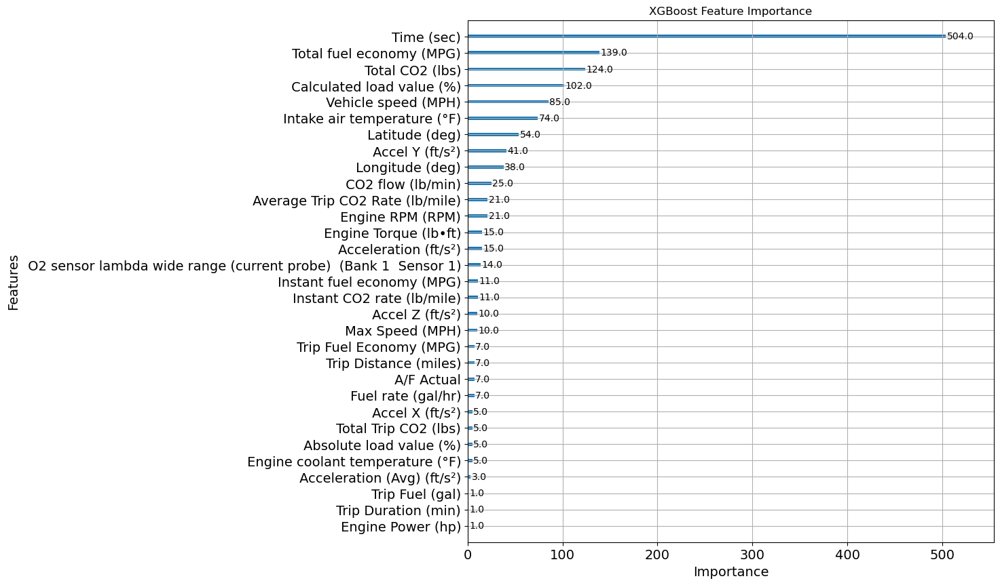

In [54]:
fig, ax = plt.subplots(figsize=(10, 10))
xgb.plot_importance(class_model, ax=ax)
ax.set_title("XGBoost Feature Importance")

plt.rcParams.update({'font.size': 12, 'font.family': 'sans-serif'})

ax.set_xlabel("Importance", fontsize=14)
ax.set_ylabel("Features", fontsize=14) 

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#plt.savefig('Plots/XGBoost_feature_importance.png', bbox_inches='tight')
plt.show()

In [55]:
from sklearn.metrics import precision_score, recall_score, accuracy_score

print("Precision = {}".format(precision_score(y_test, class_xb_y_pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, class_xb_y_pred, average='macro')))
print("Accuracy = {}".format(accuracy_score(y_test, class_xb_y_pred)))

Precision = 0.9990421455938697
Recall = 0.9990272373540856
Accuracy = 0.9990338164251208


In [56]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report, confusion_matrix


def evaluate_model(model, test_data):

    #results = model.eval(test_data, verbose=0)
    prec = precision_score(test_data, model, average='macro')
    recall = recall_score(test_data, model, average='macro')
    acc = accuracy_score(test_data, model, average='macro')

    print("    Test Precision: {:.5f}".format(prec))
    print("    Test Recall: {:.5f}".format(recall))
    print("Test Accuracy: {:.2f}%".format(acc * 100))

    y_pred = np.squeeze((model.predict(test_data) >= 0.5).astype(int))
    cm = confusion_matrix(test_data.labels, y_pred)
    clr = classification_report(test_data.labels, y_pred, target_names=["OFF", "ON"])

    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
    plt.xticks(ticks=np.arange(2) + 0.5, labels=["OFF", "ON"])
    plt.yticks(ticks=np.arange(2) + 0.5, labels=["OFF", "ON"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    print("Classification Report:\n----------------------\n", clr)

In [57]:
keys = all_df['On/Off']
keys

1622    1
1519    0
837     0
757     0
909     1
       ..
1348    1
1015    0
473     0
725     1
516     1
Name: On/Off, Length: 3448, dtype: int32

In [58]:
cm = confusion_matrix(y_test[0:11551], class_xb_y_pred)
cm

array([[521,   0],
       [  1, 513]], dtype=int64)

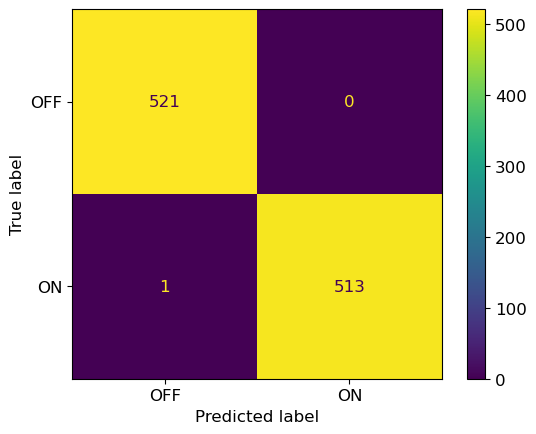

In [59]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["OFF", "ON"])
disp.plot()

In [60]:
clr = classification_report(y_test[0:11551], class_xb_y_pred, target_names=["OFF", "ON"])
print("Classification Report:\n----------------------\n", clr)

Classification Report:
----------------------
               precision    recall  f1-score   support

         OFF       1.00      1.00      1.00       521
          ON       1.00      1.00      1.00       514

    accuracy                           1.00      1035
   macro avg       1.00      1.00      1.00      1035
weighted avg       1.00      1.00      1.00      1035



In [67]:
#if gridsearch is making it worse, try optuna or randomsearch
#set up for optuna
from sklearn.model_selection import cross_validate
"""
import optuna

def objective(trial, X, y, cv, scoring):
    rf_params = {
        "n_estimators": trial.suggest_float(name="n_estimators", low=100, high=2000),
        "max_depth": trial.suggest_float("max_depth", 3, 8),
        "max_features": trial.suggest_categorical(
            "max_features", choices=["auto", "sqrt", "log2"]
        ),
        "n_jobs": -1,
        "random_state": 124,
    }
    
    #CV
    rf_class = RandomForestClassifier(**rf_params)
    scores = cross_validation(rf_class, x_class, y_class, cv=cv, scoring=scoring, n_jobs = n_jobs)
    
    rmsrf = np.sqrt(-scores["test_scores"].mean())
    return rf_class


func = lambda trial: objective(trial, x_class, y_class, cv=rf_class, scoring="neg_mean_squared_log_error")
"""


In [105]:
# Create study that minimizes
#study = optuna.create_study(direction="minimize")

# Start optimizing with 100 trials
#study.optimize(func, n_trials=100)

In [ ]:
#print(f"Base RMSLE     : {rmsle:.5f}")
#print(f"Optimized RMSLE: {study.best_value:.5f}")

In [ ]:
#print("Best params:")
#for key, value in study.best_params.items():
#    print(f"\t{key}: {value}")

In [ ]:
#put in somewhere the connection between the classifier that determines if the ac is on or not
#then the regressor that predicts fuel rate gal/hr or one of the engine power related ones

#['On or Off']

In [79]:
#regression starts below
#on_df = full_df

In [85]:
on_df = full_df
on_df['On or Off']

0       On
1       On
2       On
3       On
4       On
        ..
1760    On
1761    On
1762    On
1763    On
1764    On
Name: On or Off, Length: 1765, dtype: object

In [87]:
#only use 'on' data
on_df = on_df.drop(columns='On or Off')
on_df.head()


,Time (sec),Timestamp,Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),...,Trip Distance (miles),Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG)
0,0.000,2024-07-12 20:21:18,34.03307,-118.4652,0.0,0.0,0.0000,0.000000,0.0,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,-6.347265,10.080920,-18.084070,0.000000,0.0
1,2.399,2024-07-12 20:21:18,34.03307,-118.4652,0.0,0.0,403.3773,0.151668,0.0,31.02312,...,0.0,0.034234,0.0,0.0,0.003549,0.801627,-0.206871,-0.298559,0.000181,0.0
2,3.392,2024-07-12 20:21:18,34.03306,-118.4652,0.0,0.0,403.3797,0.122081,0.0,31.02293,...,0.0,0.051419,0.0,0.0,0.005990,0.238660,-0.176041,-3.889984,0.000306,0.0
3,4.395,2024-07-12 20:21:18,34.03305,-118.4652,0.0,0.0,403.3816,0.118347,0.0,31.02279,...,0.0,0.068604,0.0,0.0,0.007872,1.230891,-0.479812,1.762333,0.000402,0.0
4,5.392,2024-07-12 20:21:18,34.03305,-118.4652,0.0,0.0,403.3835,0.118347,0.0,31.02264,...,0.0,0.085737,0.0,0.0,0.009824,1.734274,-0.879573,2.986771,0.000501,0.0


In [88]:
on_df = on_df.drop(columns=['Timestamp'])
on_df.keys()

Index(['Time (sec)', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Fuel rate (gal/hr)',
       ' Calculated load value (%)', ' Engine coolant temperature (°F)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Ambient air temperature (°F)',
       ' Engine coolant temperature 1 (°F)',
       ' Intake air temperature bank 1  sensor 1 (°F)',
       ' Engine Fuel Rate (lb/min)', ' Vehicle Fuel Rate (lb/min)',
       ' Engine Exhaust Flow Rate (lb/min)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual', ' Trip Distance (miles)',
       ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 Rate (lb/mile

In [89]:
#padding, continue to regressor

#regressor using fuel rate
y=on_df[' Fuel rate (gal/hr)']
x=on_df.loc[:, on_df.columns != ' Fuel rate (gal/hr)']

print(x.shape)
print(y.shape)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=100)

print(X_train.shape)
print(X_test.shape)

(1765, 36)
(1765,)
(1235, 36)
(530, 36)


In [90]:
#xgboost
from sklearn.metrics import accuracy_score, confusion_matrix
import xgboost as xgb
from xgboost import plot_importance

#data for xgb


dtrain = xgb.DMatrix(X_train, label=y_train, enable_categorical=True)

dtest = xgb.DMatrix(X_test, label=y_test, enable_categorical=True)



In [91]:
params = {
    'objective': 'reg:squarederror',  # Use 'reg:squarederror' for regression tasks
    'max_depth': 7,                   # Maximum depth of a tree
    'learning_rate': 0.1,             # Learning rate
    'subsample': 0.8,                 # Subsample ratio of the training instances
    'colsample_bytree': 0.8,          # Subsample ratio of columns when constructing each tree
    'eval_metric': 'rmse'             # Evaluation metric (root mean squared error)
}
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

#create model
xgb_model = xgb.XGBRegressor()


In [92]:
#search for the right params



grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

print('Done')



Done


In [93]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

xb_y_pred = best_model.predict(X_test)

# Calculate R2 score
xb_r2 = r2_score(y_test, xb_y_pred)
# Calculate RMSE
xb_rmse = mean_squared_error(y_test, xb_y_pred, squared=False)

print("RMSE:", xb_rmse)
print("R2 score:", xb_r2)

RMSE: 0.038997253442135026
R2 score: 0.9993222922351387


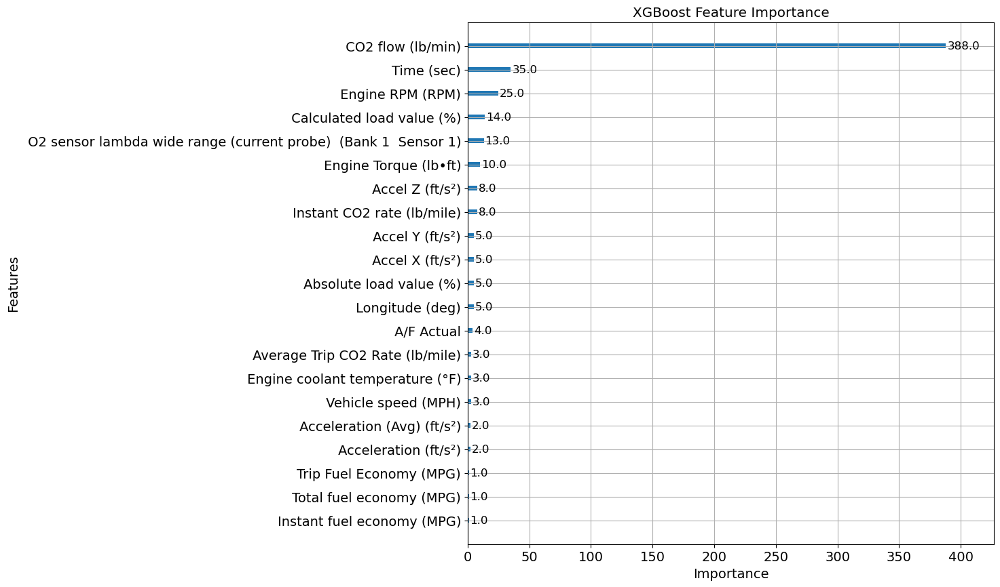

In [94]:
fig, ax = plt.subplots(figsize=(10, 10))
xgb.plot_importance(best_model, ax=ax)
ax.set_title("XGBoost Feature Importance")

plt.rcParams.update({'font.size': 12, 'font.family': 'sans-serif'})

ax.set_xlabel("Importance", fontsize=14)
ax.set_ylabel("Features", fontsize=14) 

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#plt.savefig('Plots/XGBoost_feature_importance.png', bbox_inches='tight')
plt.show()

In [95]:
features_for_xgb = [ 'Time (sec)', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Calculated load value (%)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)', ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual',
       ' Trip Distance (miles)', ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 Rate (lb/mile)', ' Total Trip CO2 (lbs)',
       ' Accel X (ft/s²)', ' Accel Y (ft/s²)', ' Accel Z (ft/s²)', ' Trip Fuel (gal)', ' Trip Fuel Economy (MPG)' ]

In [96]:
train_set_ = X_train[features_for_xgb]
train_set_.keys()

Index(['Time (sec)', ' Latitude (deg)', ' Longitude (deg)',
       ' Vehicle speed (MPH)', ' Instant CO2 rate (lb/mile)',
       ' Total CO2 (lbs)', ' CO2 flow (lb/min)', ' Instant fuel economy (MPG)',
       ' Total fuel economy (MPG)', ' Calculated load value (%)',
       ' Engine RPM (RPM)', ' Intake air temperature (°F)',
       ' O2 sensor lambda wide range (current probe)  (Bank 1  Sensor 1)',
       ' Absolute load value (%)', ' Acceleration (ft/s²)',
       ' Acceleration (Avg) (ft/s²)', ' Engine Power (hp)',
       ' Engine Torque (lb•ft)', ' A/F Actual', ' Trip Distance (miles)',
       ' Trip Duration (min)', ' Max Speed (MPH)',
       ' Average Trip CO2 Rate (lb/mile)', ' Total Trip CO2 (lbs)',
       ' Accel X (ft/s²)', ' Accel Y (ft/s²)', ' Accel Z (ft/s²)',
       ' Trip Fuel (gal)', ' Trip Fuel Economy (MPG)'],
      dtype='object')

In [97]:
train_set_.corr()

,Time (sec),Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),Calculated load value (%),...,Trip Distance (miles),Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG)
Time (sec),1.000000,0.952558,-0.859463,0.036734,-0.117667,0.426943,-0.068779,0.101563,0.019347,-0.059064,...,0.977779,0.999988,0.862945,-0.327039,0.985284,0.023779,-0.010005,0.025558,0.985284,0.906643
Latitude (deg),0.952558,1.000000,-0.774103,0.072040,-0.131674,0.415737,-0.097223,0.145015,0.011112,-0.037099,...,0.992748,0.952815,0.856692,-0.290208,0.987245,0.028878,-0.003686,0.021497,0.987245,0.920046
Longitude (deg),-0.859463,-0.774103,1.000000,0.162735,0.024283,-0.335892,0.139722,-0.000139,0.006419,0.113096,...,-0.835842,-0.859117,-0.596099,0.167784,-0.831549,-0.045930,0.028203,-0.015927,-0.831549,-0.636893
Vehicle speed (MPH),0.036734,0.072040,0.162735,1.000000,-0.181309,0.072249,0.485140,0.397616,0.011497,0.354442,...,0.027707,0.037589,0.451257,-0.158050,0.093385,-0.005513,0.046628,0.054925,0.093385,0.194676
Instant CO2 rate (lb/mile),-0.117667,-0.131674,0.024283,-0.181309,1.000000,-0.032484,0.354414,-0.358972,0.027931,0.394214,...,-0.120676,-0.117410,-0.193933,0.176096,-0.130946,0.000437,-0.046018,0.000173,-0.130946,-0.185038
Total CO2 (lbs),0.426943,0.415737,-0.335892,0.072249,-0.032484,1.000000,0.001063,0.074775,0.909485,0.042148,...,0.419495,0.427017,0.415505,-0.099631,0.425923,0.058463,-0.079734,0.107645,0.425923,0.452715
CO2 flow (lb/min),-0.068779,-0.097223,0.139722,0.485140,0.354414,0.001063,1.000000,-0.403432,0.015351,0.815020,...,-0.109393,-0.068262,0.137555,-0.046622,-0.067246,-0.008292,-0.010958,-0.000647,-0.067246,-0.032048
Instant fuel economy (MPG),0.101563,0.145015,-0.000139,0.397616,-0.358972,0.074775,-0.403432,1.000000,0.015100,-0.517045,...,0.123159,0.102152,0.229101,-0.103321,0.136517,-0.039812,0.013604,0.028209,0.136517,0.183052
Total fuel economy (MPG),0.019347,0.011112,0.006419,0.011497,0.027931,0.909485,0.015351,0.015100,1.000000,0.055741,...,0.011059,0.019358,0.041807,0.038578,0.012697,0.053222,-0.086305,0.105427,0.012697,0.074779
Calculated load value (%),-0.059064,-0.037099,0.113096,0.354442,0.394214,0.042148,0.815020,-0.517045,0.055741,1.000000,...,-0.058030,-0.057885,0.097940,-0.014691,-0.037581,0.060001,0.020771,0.002994,-0.037581,-0.008628


In [98]:
correlation_matrix = train_set_.corr()
correlation_matrix

,Time (sec),Latitude (deg),Longitude (deg),Vehicle speed (MPH),Instant CO2 rate (lb/mile),Total CO2 (lbs),CO2 flow (lb/min),Instant fuel economy (MPG),Total fuel economy (MPG),Calculated load value (%),...,Trip Distance (miles),Trip Duration (min),Max Speed (MPH),Average Trip CO2 Rate (lb/mile),Total Trip CO2 (lbs),Accel X (ft/s²),Accel Y (ft/s²),Accel Z (ft/s²),Trip Fuel (gal),Trip Fuel Economy (MPG)
Time (sec),1.000000,0.952558,-0.859463,0.036734,-0.117667,0.426943,-0.068779,0.101563,0.019347,-0.059064,...,0.977779,0.999988,0.862945,-0.327039,0.985284,0.023779,-0.010005,0.025558,0.985284,0.906643
Latitude (deg),0.952558,1.000000,-0.774103,0.072040,-0.131674,0.415737,-0.097223,0.145015,0.011112,-0.037099,...,0.992748,0.952815,0.856692,-0.290208,0.987245,0.028878,-0.003686,0.021497,0.987245,0.920046
Longitude (deg),-0.859463,-0.774103,1.000000,0.162735,0.024283,-0.335892,0.139722,-0.000139,0.006419,0.113096,...,-0.835842,-0.859117,-0.596099,0.167784,-0.831549,-0.045930,0.028203,-0.015927,-0.831549,-0.636893
Vehicle speed (MPH),0.036734,0.072040,0.162735,1.000000,-0.181309,0.072249,0.485140,0.397616,0.011497,0.354442,...,0.027707,0.037589,0.451257,-0.158050,0.093385,-0.005513,0.046628,0.054925,0.093385,0.194676
Instant CO2 rate (lb/mile),-0.117667,-0.131674,0.024283,-0.181309,1.000000,-0.032484,0.354414,-0.358972,0.027931,0.394214,...,-0.120676,-0.117410,-0.193933,0.176096,-0.130946,0.000437,-0.046018,0.000173,-0.130946,-0.185038
Total CO2 (lbs),0.426943,0.415737,-0.335892,0.072249,-0.032484,1.000000,0.001063,0.074775,0.909485,0.042148,...,0.419495,0.427017,0.415505,-0.099631,0.425923,0.058463,-0.079734,0.107645,0.425923,0.452715
CO2 flow (lb/min),-0.068779,-0.097223,0.139722,0.485140,0.354414,0.001063,1.000000,-0.403432,0.015351,0.815020,...,-0.109393,-0.068262,0.137555,-0.046622,-0.067246,-0.008292,-0.010958,-0.000647,-0.067246,-0.032048
Instant fuel economy (MPG),0.101563,0.145015,-0.000139,0.397616,-0.358972,0.074775,-0.403432,1.000000,0.015100,-0.517045,...,0.123159,0.102152,0.229101,-0.103321,0.136517,-0.039812,0.013604,0.028209,0.136517,0.183052
Total fuel economy (MPG),0.019347,0.011112,0.006419,0.011497,0.027931,0.909485,0.015351,0.015100,1.000000,0.055741,...,0.011059,0.019358,0.041807,0.038578,0.012697,0.053222,-0.086305,0.105427,0.012697,0.074779
Calculated load value (%),-0.059064,-0.037099,0.113096,0.354442,0.394214,0.042148,0.815020,-0.517045,0.055741,1.000000,...,-0.058030,-0.057885,0.097940,-0.014691,-0.037581,0.060001,0.020771,0.002994,-0.037581,-0.008628


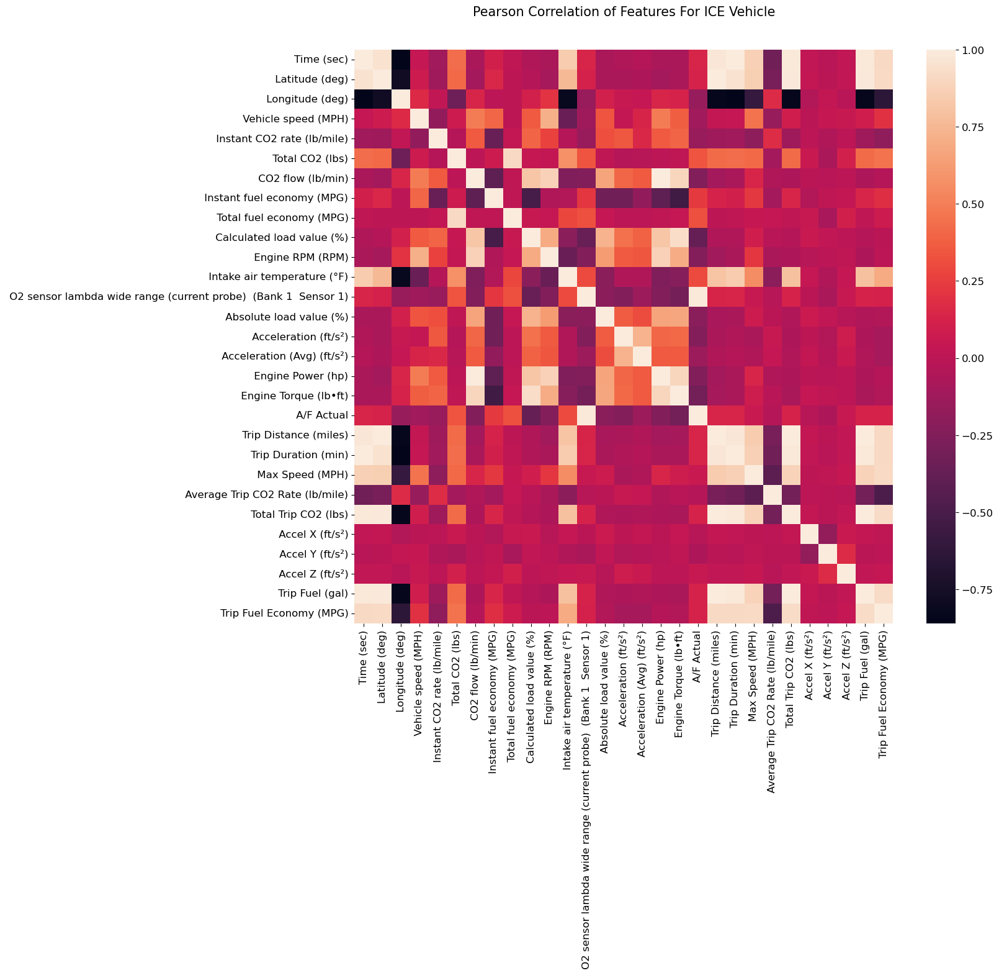

In [99]:
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features For ICE Vehicle', y=1.05, size=15)
sns.heatmap(correlation_matrix);

In [100]:

#stacking regressor 
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import lightgbm as lgb

from lightgbm import LGBMRegressor

lgbm = LGBMRegressor(metric='rmse')

#include models that have shown good results in the past, so RF, XGB, LightGB, and Linear
estimators = [("DT", DecisionTreeRegressor()),
              ("RF", RandomForestRegressor()),
              ("XGBoost", xgb.XGBRegressor()),
              ("LightGB", LGBMRegressor()),
              ("LR", LinearRegression())
             ]

In [101]:
#make the stacking model with those other ones

stacking_model = StackingRegressor(estimators=estimators, cv=5, passthrough=False)


#improving ensembles
params = {
    "DT__max_depth": [2, 4, 8],
    "XGBoost__max_depth":[10, 25],  
    
}

stack_grid = GridSearchCV(stacking_model, params, cv=3, verbose=4, scoring='neg_root_mean_squared_error', refit=True, n_jobs=-1)
stack_grid.fit(X_train, y_train)
print(stack_grid.best_params_)
stack_grid.cv_results_['mean_test_score']


print("best parameters:", stack_grid.best_params_)

rmse_stack_cv = -1*stack_grid.best_score_
print("[STACK] RMSE for the best model is : {:.2f}".format(rmse_stack_cv))



Fitting 3 folds for each of 6 candidates, totalling 18 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6635
[LightGBM] [Info] Number of data points in the train set: 1235, number of used features: 30
[LightGBM] [Info] Start training from score 1.455555
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6595
[LightGBM] [Info] Number of data points in the train set: 988, number of used features: 30
[LightGBM] [Info] Start training from score 1.477023
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] A

In [102]:
#cross scores
from sklearn.model_selection import cross_val_score
print('Performing Cross-Validation...')


three_cross_scores = cross_val_score(stacking_model, X_train, y_train, cv=3, scoring='neg_root_mean_squared_error')
three_cross_scores = -1 * (three_cross_scores)
rmse_avg = np.average(three_cross_scores)

print('End')
print('average score: {}'.format(rmse_avg))

Performing Cross-Validation...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6525
[LightGBM] [Info] Number of data points in the train set: 823, number of used features: 30
[LightGBM] [Info] Start training from score 1.457646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5583
[LightGBM] [Info] Number of data points in the t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Foun

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [103]:
estimators_best = [
    ("DT", DecisionTreeRegressor(max_depth=4)),
    ("RF", RandomForestRegressor()),
    ("XGBoost", xgb.XGBRegressor()),
    ("LightGB", LGBMRegressor()),
    ("LR", LinearRegression())
]

stacking_best_model = StackingRegressor(estimators=estimators_best, cv=5, passthrough=False)

stacking_best_pred = stacking_best_model.fit_transform(X_test, y_test)



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4550
[LightGBM] [Info] Number of data points in the train set: 530, number of used features: 30
[LightGBM] [Info] Start training from score 1.503771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

In [104]:
best_three_cross_scores = cross_val_score(stacking_best_model, X_train, y_train, cv=3, scoring='neg_root_mean_squared_error')
best_three_cross_scores = -1 * (best_three_cross_scores)
best_rmse_avg = np.average(best_three_cross_scores)

print('End')
print('average score: {}'.format(best_rmse_avg))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6525
[LightGBM] [Info] Number of data points in the train set: 823, number of used features: 30
[LightGBM] [Info] Start training from score 1.457646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5583
[LightGBM] [Info] Number of data points in the train set: 658, number of used f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6537
[LightGBM] [Info] Number of data points in the tr

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [105]:
stacking_best_model = StackingRegressor(estimators=estimators_best,cv=5, passthrough = True)
stacking_best_model.fit(X_train, y_train)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6635
[LightGBM] [Info] Number of data points in the train set: 1235, number of used features: 30
[LightGBM] [Info] Start training from score 1.455555
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6595
[LightGBM] [Info] Number of data points in the train set: 988, number of used features: 30
[LightGBM] [Info] Start training from score 1.477023
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testi

StackingRegressor(cv=5,
                  estimators=[('DT', DecisionTreeRegressor(max_depth=4)),
                              ('RF', RandomForestRegressor()),
                              ('XGBoost',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            gpu_id=N...
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...)),
                              ('LightGB', LGBMRegressor()),
                              ('LR', LinearRegression())],
                  passthrough=True)

In [106]:
stacking_best_pred = stacking_best_model.predict(X_test)

stack_rmse = mean_squared_error(y_test, stacking_best_pred, squared = False)


stack_r2 = r2_score(y_test, stacking_best_pred)
           
print('Root Mean Squared Error: {0}'.format(stack_rmse))
print('R2: {0}'.format(stack_r2)) 

Root Mean Squared Error: 3.475082327902863e-05
R2: 0.9999999994618485


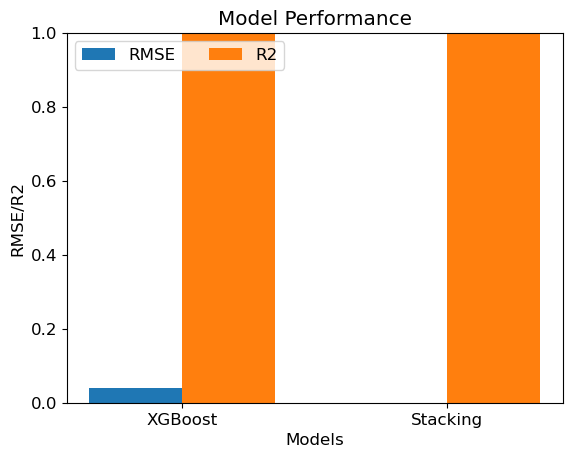

In [107]:
#display results
RMSE_Results = [xb_rmse, stack_rmse]
R2_Results = [xb_r2, stack_r2]
labels = ['XGBoost', 'Stacking']

rg= np.arange(2)
width = 0.35
plt.bar(rg, RMSE_Results, width, label="RMSE")
plt.bar(rg+width, R2_Results, width, label='R2')
plt.xticks(rg + width/2, labels)
plt.xlabel("Models")
plt.ylabel("RMSE/R2")
plt.ylim([0,1])

plt.title('Model Performance')
plt.legend(loc='upper left', ncol=2)
plt.show()


Total RMSE: 0.022925801812038113


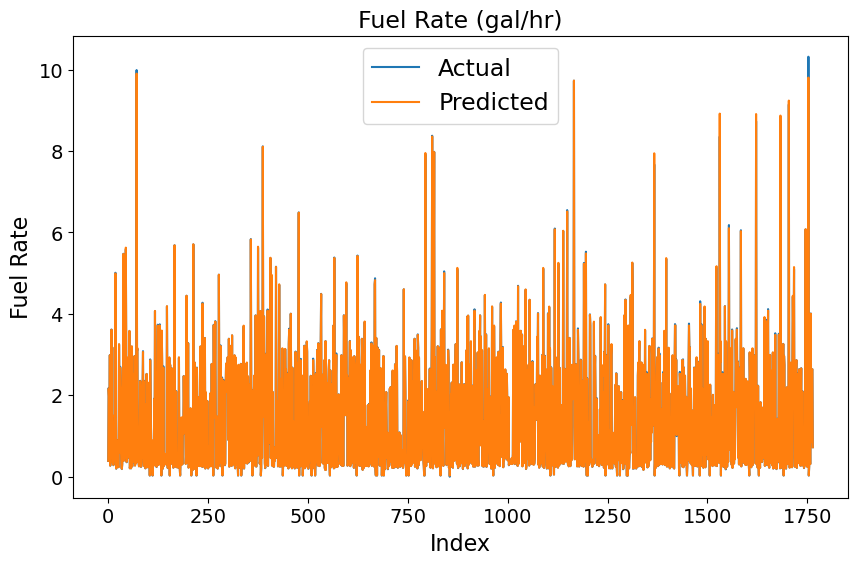

In [108]:
x_total = np.concatenate([X_train, X_test])
y_total = np.concatenate([y_train, y_test ])



# Make predictions
total_predictions = best_model.predict(x_total).flatten() 

# Return results of best model as Dataframe
results_total = pd.DataFrame(data = {"Total Predictions": total_predictions, 'Actuals': y_total})

# Calculate and display RMSE for best model
rmse_total = np.sqrt(mean_squared_error(results_total['Actuals'], results_total['Total Predictions']))
print(f'\nTotal RMSE: {rmse_total}')

# Ensure the total data and predictions are in a Pandas DataFrame
y_total_df = pd.DataFrame(y_total)
preds_total_df = pd.DataFrame(total_predictions, columns=['predicted'])

# Sort the DataFrame by index for plotting
y_total_df.sort_index(inplace=True)
preds_total_df.sort_index(inplace=True)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(y_total_df, label='Actual')
plt.plot(preds_total_df, label='Predicted')
plt.title('Fuel Rate (gal/hr)', fontsize = 17)
plt.xlabel('Index', fontsize = 16)
plt.ylabel('Fuel Rate', fontsize = 16)
plt.legend(fontsize = 17)


plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)


plt.show()

In [ ]:
#check again once weathermap api is attached. if the output is still good, stacking could be a decent candidate when using
#ensemble models inside of it like lightGB and XGB
#padding for trying this out with the other target feature candidate


In [109]:
#Next target feature

#regressor using  Engine Power (hp)
y=on_df[' Engine Power (hp)']
x=on_df.loc[:, on_df.columns != ' Engine Power (hp)']

print(x.shape)
print(y.shape)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=100)

print(X_train.shape)
print(X_test.shape)

(1765, 36)
(1765,)
(1235, 36)
(530, 36)


In [110]:
#data for xgb

dtrain = xgb.DMatrix(X_train, label=y_train)

dtest = xgb.DMatrix(X_test, label=y_test)


In [111]:
params = {
    'objective': 'reg:squarederror',  # Use 'reg:squarederror' for regression tasks
    'max_depth': 7,                   # Maximum depth of a tree
    'learning_rate': 0.1,             # Learning rate
    'subsample': 0.8,                 # Subsample ratio of the training instances
    'colsample_bytree': 0.8,          # Subsample ratio of columns when constructing each tree
    'eval_metric': 'rmse'             # Evaluation metric (root mean squared error)
}
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

#create model
xgb_model = xgb.XGBRegressor()

In [112]:
#search for the right params



grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

print('Done')


Done


In [113]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_
#make model names more distinct so they don't overwrite each other. Run again afterwards and use in visualization

xb_y_pred = best_model.predict(X_test)

# Calculate R2 score
xb_r2 = r2_score(y_test, xb_y_pred)
# Calculate RMSE
xb_rmse = mean_squared_error(y_test, xb_y_pred, squared=False)

print("RMSE:", xb_rmse)
print("R2 score:", xb_r2)

RMSE: 0.4913871628485675
R2 score: 0.9994276302324849


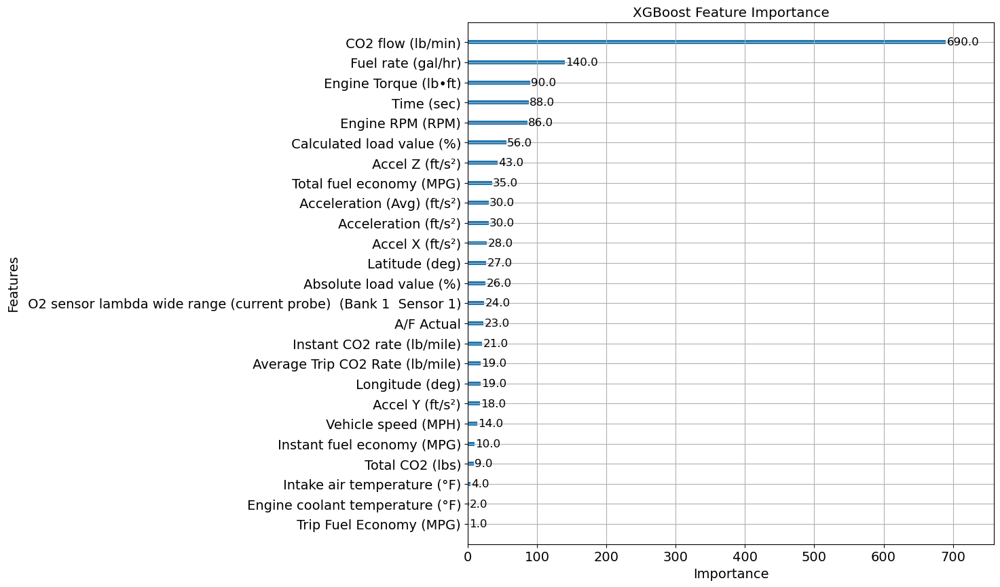

In [114]:
fig, ax = plt.subplots(figsize=(10, 10))
xgb.plot_importance(best_model, ax=ax)
ax.set_title("XGBoost Feature Importance")

plt.rcParams.update({'font.size': 12, 'font.family': 'sans-serif'})

ax.set_xlabel("Importance", fontsize=14)
ax.set_ylabel("Features", fontsize=14) 

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#plt.savefig('Plots/XGBoost_feature_importance.png', bbox_inches='tight')
plt.show()

In [115]:

#stacking regressor 
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import lightgbm as lgb

from lightgbm import LGBMRegressor

lgbm = LGBMRegressor(metric='rmse')


estimators = [("DT", DecisionTreeRegressor()),
              ("RF", RandomForestRegressor()),
              ("XGBoost", xgb.XGBRegressor()),
              ("LightGB", LGBMRegressor()),
              ("LR", LinearRegression())
             ]

In [116]:
#make the stacking model with those other ones

stacking_eng_model = StackingRegressor(estimators=estimators, cv=5, passthrough=False)


#improving ensembles
params = {
    "DT__max_depth": [2, 4, 8],
    "XGBoost__max_depth":[10, 25],  
    
}

stack_grid = GridSearchCV(stacking_eng_model, params, cv=3, verbose=4, scoring='neg_root_mean_squared_error', refit=True, n_jobs=-1)
stack_grid.fit(X_train, y_train)
print(stack_grid.best_params_)
stack_grid.cv_results_['mean_test_score']


print("best parameters:", stack_grid.best_params_)

rmse_stack_cv = -1*stack_grid.best_score_
print("[STACK] RMSE for the best model is : {:.2f}".format(rmse_stack_cv))


Fitting 3 folds for each of 6 candidates, totalling 18 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6635
[LightGBM] [Info] Number of data points in the train set: 1235, number of used features: 30
[LightGBM] [Info] Start training from score 19.957272
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6595
[LightGBM] [Info] Number of data points in the train set: 988, number of used features: 30
[LightGBM] [Info] Start training from score 20.251623
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info]

In [117]:
#cross scores
from sklearn.model_selection import cross_val_score
print('Performing Cross-Validation...')


three_cross_scores = cross_val_score(stacking_eng_model, X_train, y_train, cv=3, scoring='neg_root_mean_squared_error')
three_cross_scores = -1 * (three_cross_scores)
rmse_avg = np.average(three_cross_scores)

print('End')
print('average score: {}'.format(rmse_avg))

Performing Cross-Validation...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6525
[LightGBM] [Info] Number of data points in the train set: 823, number of used features: 30
[LightGBM] [Info] Start training from score 19.985944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5583
[LightGBM] [Info] Number of data points in the 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [118]:
stacking_eng_best_model = StackingRegressor(estimators=estimators_best,cv=5, passthrough = True)
stacking_eng_best_model.fit(X_train, y_train)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6635
[LightGBM] [Info] Number of data points in the train set: 1235, number of used features: 30
[LightGBM] [Info] Start training from score 19.957272
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6595
[LightGBM] [Info] Number of data points in the train set: 988, number of used features: 30
[LightGBM] [Info] Start training from score 20.251623
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of tes

StackingRegressor(cv=5,
                  estimators=[('DT', DecisionTreeRegressor(max_depth=4)),
                              ('RF', RandomForestRegressor()),
                              ('XGBoost',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            gpu_id=N...
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...)),
                              ('LightGB', LGBMRegressor()),
                              ('LR', LinearRegression())],
                  passthrough=True)

In [119]:
stacking_best_eng_pred = stacking_eng_best_model.predict(X_test)

stack_rmse = mean_squared_error(y_test, stacking_best_eng_pred, squared = False)


stack_r2 = r2_score(y_test, stacking_best_eng_pred)
           
print('Root Mean Squared Error: {0}'.format(stack_rmse))
print('R2: {0}'.format(stack_r2)) 

Root Mean Squared Error: 0.0024340280163609685
R2: 0.9999999859563429


In [120]:
#padding for more visualization tools 

In [121]:

sub_df = pd.DataFrame(on_df.corr()[' Engine Power (hp)'])
#sub_df.drop( 'Engine Power (hp)', axis=0)
sub_df

,Engine Power (hp)
Time (sec),-0.071519
Latitude (deg),-0.095934
Longitude (deg),0.149792
Vehicle speed (MPH),0.498367
Instant CO2 rate (lb/mile),0.342625
Total CO2 (lbs),-0.008728
CO2 flow (lb/min),1.000000
Instant fuel economy (MPG),-0.386613
Total fuel economy (MPG),0.007273
Fuel rate (gal/hr),1.000000


In [122]:

corrs_sorted = sub_df.sort_values(by=[' Engine Power (hp)'], ascending=False)
#top 10 features correlated to EP
top_10 = corrs_sorted[1:11].index
top_ten_corr = list(top_10)
top_ten_corr

[' Fuel rate (gal/hr)',
 ' CO2 flow (lb/min)',
 ' Engine Torque (lb•ft)',
 ' Engine RPM (RPM)',
 ' Calculated load value (%)',
 ' Absolute load value (%)',
 ' Vehicle speed (MPH)',
 ' Acceleration (ft/s²)',
 ' Acceleration (Avg) (ft/s²)',
 ' Instant CO2 rate (lb/mile)']

In [123]:
corr_values = sub_df.sort_values(by=[' Engine Power (hp)'], ascending=False).values
top_10_val = corr_values[1:11]

top_ten_val = list(top_10_val)
top_ten_val

[array([1.]),
 array([1.]),
 array([0.89142866]),
 array([0.87723697]),
 array([0.80523034]),
 array([0.66979228]),
 array([0.49836674]),
 array([0.38298146]),
 array([0.35906163]),
 array([0.34262461])]

In [124]:
top_ten_corr = pd.DataFrame(top_ten_val, index =top_ten_corr)

In [125]:
top_ten_corr

,0
Fuel rate (gal/hr),1.000000
CO2 flow (lb/min),1.000000
Engine Torque (lb•ft),0.891429
Engine RPM (RPM),0.877237
Calculated load value (%),0.805230
Absolute load value (%),0.669792
Vehicle speed (MPH),0.498367
Acceleration (ft/s²),0.382981
Acceleration (Avg) (ft/s²),0.359062
Instant CO2 rate (lb/mile),0.342625


<Axes: >

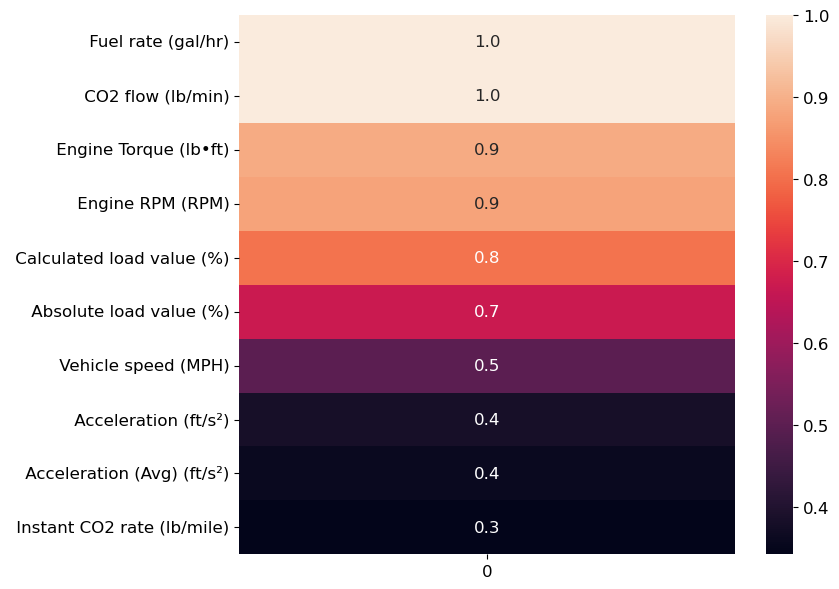

In [126]:
#correlation matrix
"""
top_ten_corr = pd.DataFrame(data=top_ten_corr)
top_ten_corr = pd.concat([top_ten_corr, all_df[' Engine Power (hp)']])
corr_mat = pd.DataFrame(data=top_ten_corr)
"""

corr_mat = top_ten_corr
fig, ax = plt.subplots(figsize=(8, 7))

cmap = sns.diverging_palette(10, 220, as_cmap=True)

sns.heatmap(corr_mat, annot=True, fmt=".1f")

#ax.set_yticklabels(ax.get_yticklabels(), rotation=0, horizontalalignment='right')
#ax.set_xticklabels(ax.get_yticklabels(), horizontalalignment='center')
#ax.set(title='Correlation Matrix (training data)');

In [127]:
sns.pairplot(on_df)

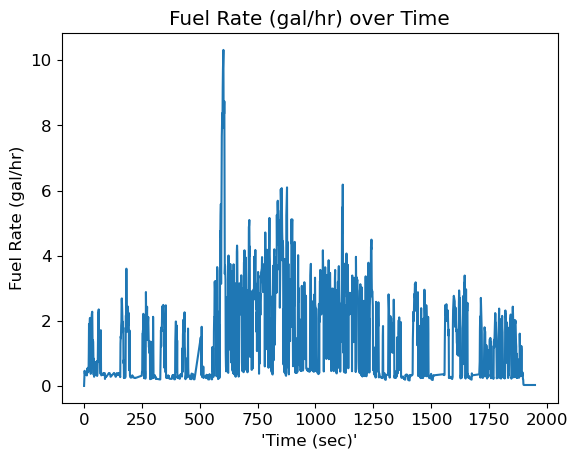

In [129]:
plt.plot(on_df['Time (sec)'],on_df[' Fuel rate (gal/hr)'])
plt.title("Fuel Rate (gal/hr) over Time")

plt.ylabel("Fuel Rate (gal/hr)")
plt.xlabel("'Time (sec)'")
plt.show()